# Importing libraries

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D,SpatialDropout2D,AveragePooling2D
from tensorflow.keras.optimizers import Adam
from PIL import Image 
import os
from glob import glob 
import cv2
import seaborn as sns
import random
from tensorflow.keras import mixed_precision
from tensorflow.keras.callbacks import ReduceLROnPlateau
import pandas as pd
from tensorflow.keras.callbacks import EarlyStopping

policy = mixed_precision.Policy('mixed_float16')  
mixed_precision.set_global_policy(policy)
gpu = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpu[0], True)

# Data analysis

In [ ]:
dataset_path = "PlantDiseaseDataset"

In [ ]:
class_names = [x for x in os.listdir(dataset_path)]

In [ ]:
class_names

['Apple__black_rot',
 'Apple__healthy',
 'Apple__rust',
 'Apple__scab',
 'Cassava__bacterial_blight',
 'Cassava__brown_streak_disease',
 'Cassava__green_mottle',
 'Cassava__healthy',
 'Cassava__mosaic_disease',
 'Cherry__healthy',
 'Cherry__powdery_mildew',
 'Chili__healthy',
 'Chili__leaf_curl',
 'Chili__leaf_spot',
 'Chili__whitefly',
 'Chili__yellowish',
 'Coffee__cercospora_leaf_spot',
 'Coffee__healthy',
 'Coffee__red_spider_mite',
 'Coffee__rust',
 'Corn__common_rust',
 'Corn__gray_leaf_spot',
 'Corn__healthy',
 'Corn__northern_leaf_blight',
 'Cucumber__diseased',
 'Cucumber__healthy',
 'Gauva__diseased',
 'Gauva__healthy',
 'Grape__black_measles',
 'Grape__black_rot',
 'Grape__healthy',
 'Grape__leaf_blight_(isariopsis_leaf_spot)',
 'Jamun__diseased',
 'Jamun__healthy',
 'Lemon__diseased',
 'Lemon__healthy',
 'Mango__diseased',
 'Mango__healthy',
 'Peach__bacterial_spot',
 'Peach__healthy',
 'Pepper_bell__bacterial_spot',
 'Pepper_bell__healthy',
 'Pomegranate__diseased',
 'Pome

In [ ]:
classes = os.listdir(dataset_path)

plt.figure(figsize=(16, 88))

for i, class_name in enumerate(classes[:88]):  # Візьмемо 6 класів для прикладу
    class_path = os.path.join(dataset_path, class_name)
    images = os.listdir(class_path)
    img_path = os.path.join(class_path, random.choice(images))
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(22, 4, i + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.show()

In [ ]:

pd.set_option('display.max_rows', None)

class_counts = {class_name: len(os.listdir(os.path.join(dataset_path, class_name))) for class_name in class_names}

df_classes = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])
df_classes = df_classes.sort_values(by="Count", ascending=False)

In [ ]:
cls_name = glob(dataset_path+'\*')
dic_cls = {}

cls_df = pd.DataFrame({}, columns=['Plant', 'Disease', 'Count'])
for cls in cls_name:
    cls_split = cls.split('\\')[-1]
    cls_df = cls_df._append({'Plant': cls_split.split('__')[0], 'Disease':cls_split.split('__')[1], 'Count':len(glob(cls + '/*'))}, ignore_index=True)
cls_df.head()
print(cls_df.to_string())

          Plant                                 Disease  Count
0         Apple                               black_rot    621
1         Apple                                 healthy   1648
2         Apple                                    rust    356
3         Apple                                    scab    695
4       Cassava                        bacterial_blight    484
5       Cassava                    brown_streak_disease    534
6       Cassava                            green_mottle    468
7       Cassava                                 healthy    676
8       Cassava                          mosaic_disease    443
9        Cherry                                 healthy    892
10       Cherry                          powdery_mildew   1052
11        Chili                                 healthy     87
12        Chili                               leaf_curl    100
13        Chili                               leaf_spot    100
14        Chili                                whitefly

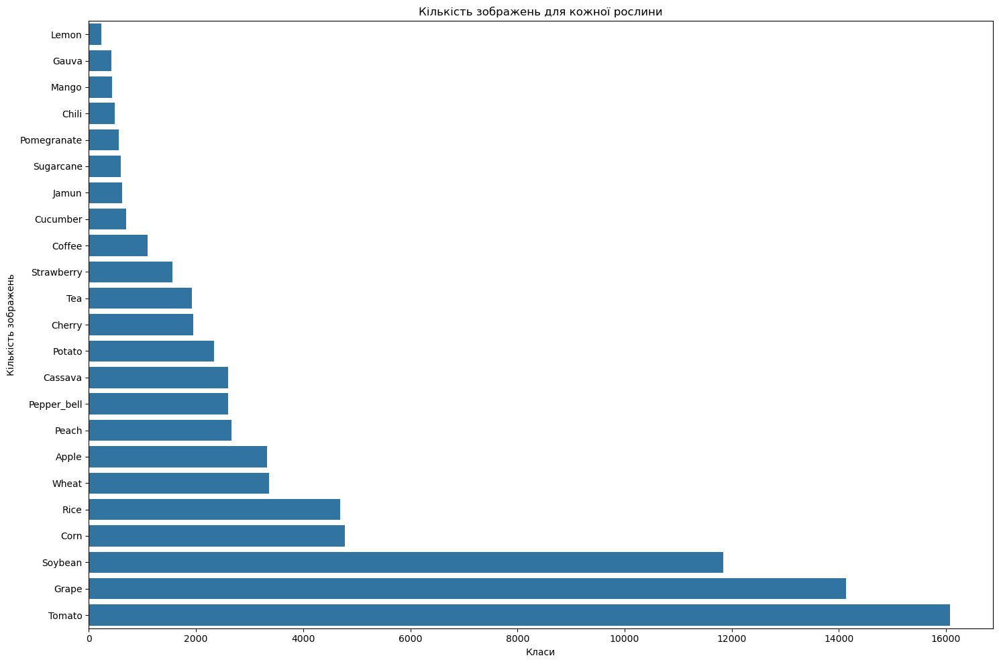

In [ ]:
cont_plants = cls_df.groupby('Plant')['Count'].sum().sort_values()
plt.figure(figsize=(15,10))
sns.barplot(x=cont_plants, y=cont_plants.index)
plt.title('Кількість зображень для кожної рослини')
plt.xlabel("Класи")
plt.ylabel("Кількість зображень")
plt.tight_layout()
plt.show()

In [ ]:
cls_df = cls_df.groupby('Plant').apply(lambda x: x.sort_values('Count', ascending=False)).reset_index(drop=True)

C:\Users\Dmitr\AppData\Local\Temp\ipykernel_1547064\452111616.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  cls_df = cls_df.groupby('Plant').apply(lambda x: x.sort_values('Count', ascending=False)).reset_index(drop=True)


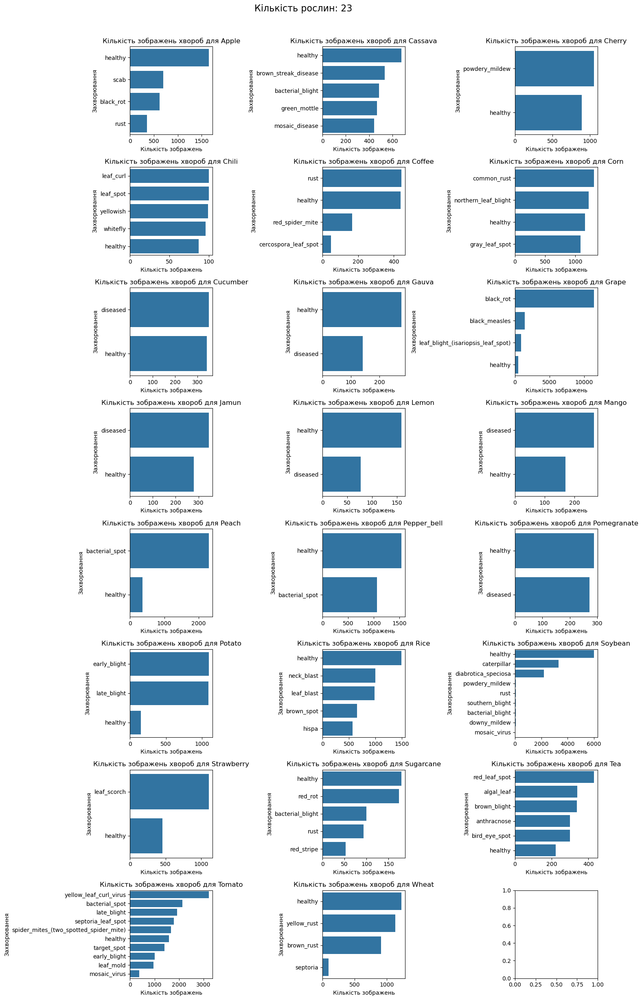

In [ ]:
fig, axes = plt.subplots(nrows=(len(set(cls_df['Plant']))//3)+1, ncols= 3, figsize=(15, 25))

fig.suptitle('Кількість рослин: ' + str(len(set(cls_df['Plant']))) + '\n\n\n', fontsize=16)

for (plant, data), ax in zip(cls_df.groupby('Plant'), axes.flatten()):
    sns.barplot(x='Count', y='Disease', data=data, ax=ax)
    ax.set_title(f'Кількість зображень хвороб для {plant}')
    ax.set_xlabel('Кількість зображень')
    ax.set_ylabel('Захворювання')
    
for ax in axes.flatten()[len(cls_df['Plant']):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

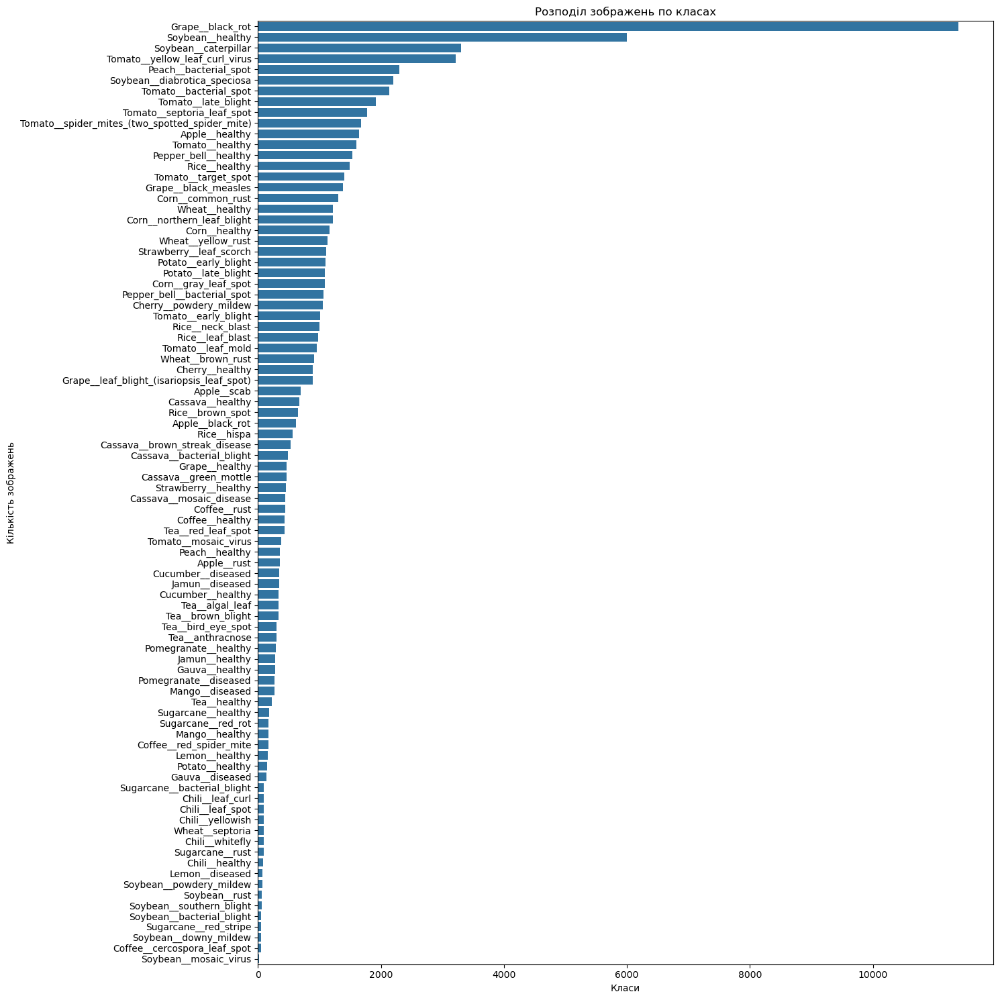

In [ ]:
pd.set_option('display.max_rows', None)

plt.figure(figsize=(15,15))
sns.barplot(x= df_classes["Count"], y=df_classes["Class"])
plt.title("Розподіл зображень по класах")
plt.xlabel("Класи")
plt.ylabel("Кількість зображень")
plt.tight_layout()
plt.show()


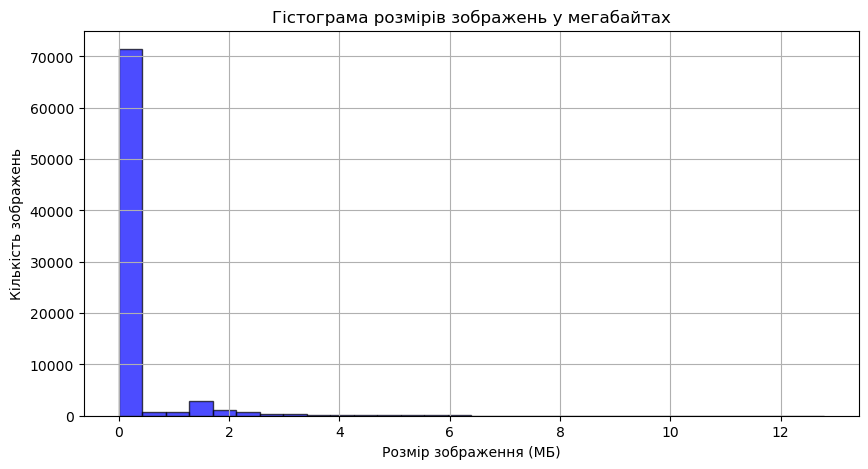

In [ ]:
image_sizes = []

# Отримання всіх зображень у папці
image_sizes_mb = []

for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            if os.path.isfile(img_path):
                image_sizes_mb.append(os.path.getsize(img_path) / (1024 * 1024))

# Побудова гістограми
plt.figure(figsize=(10, 5))
plt.hist(image_sizes_mb, bins=30, color="blue", alpha=0.7, edgecolor="black")
plt.xlabel("Розмір зображення (МБ)")
plt.ylabel("Кількість зображень")
plt.title("Гістограма розмірів зображень у мегабайтах")
plt.grid(True)
plt.show()


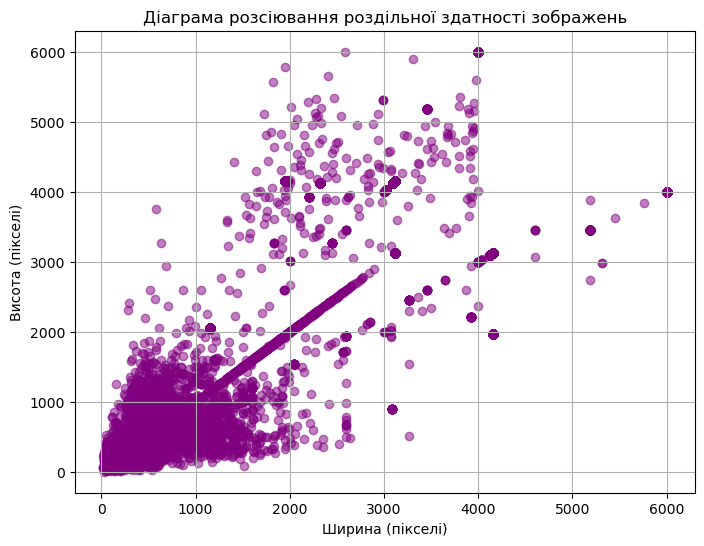

In [ ]:
image_sizes = []

for class_name in class_names:
    class_path = os.path.join(dataset_path, class_name)
    images = os.listdir(class_path)

    for img_name in images:
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            image_sizes.append(img.shape[:2])  # (height, width)

# Перетворимо в DataFrame для візуалізації
df_sizes = pd.DataFrame(image_sizes, columns=["Height", "Width"])

plt.figure(figsize=(8, 6))
plt.scatter(df_sizes["Width"], df_sizes["Height"], alpha=0.5, color="purple")
plt.xlabel("Ширина (пікселі)")
plt.ylabel("Висота (пікселі)")
plt.title("Діаграма розсіювання роздільної здатності зображень")
plt.grid(True)
plt.show()


In [ ]:
# Мінімальний розмір зображення
min_size = df_sizes.min()
print(f"Мінімальний розмір: {min_size['Height']} x {min_size['Width']}")

# Максимальний розмір зображення
max_size = df_sizes.max()
print(f"Максимальний розмір: {max_size['Height']} x {max_size['Width']}")


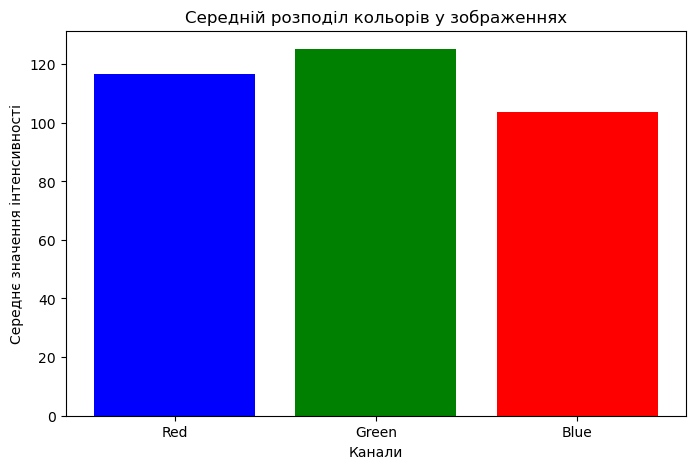

In [ ]:
mean_colors = {"Red": [], "Green": [], "Blue": []}

for class_name in classes:
    class_path = os.path.join(dataset_path, class_name)
    images = os.listdir(class_path)[:10]  # Візьмемо 10 зображень з кожного класу для аналізу

    for img_name in images:
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            mean_colors["Blue"].append(np.mean(img[:, :, 0]))  # Канал B
            mean_colors["Green"].append(np.mean(img[:, :, 1]))  # Канал G
            mean_colors["Red"].append(np.mean(img[:, :, 2]))  # Канал R

# Візуалізація
plt.figure(figsize=(8, 5))
plt.bar(mean_colors.keys(), [np.mean(mean_colors[c]) for c in mean_colors], color=["blue", "green", "red"])
plt.xlabel("Канали")
plt.ylabel("Середнє значення інтенсивності")
plt.title("Середній розподіл кольорів у зображеннях")
plt.show()


# Solving the problem of class imbalance

In [ ]:
import os
import shutil
import random

# Вхідна папка з датасетом
output_folder = "PlantDiseaseDatasetSplit2"
train_ratio, valid_ratio = 0.8, 0.2

# Створюємо вихідні папки
for split in ["train", "valid"]:
    os.makedirs(os.path.join(output_folder, split), exist_ok=True)

# Проходимо по всіх класах
for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if not os.path.isdir(class_path):
        continue

    # Отримуємо список файлів та перемішуємо
    images = os.listdir(class_path)
    random.shuffle(images)

    # Розраховуємо кількість для кожного спліту
    total = len(images)
    train_count = int(total * train_ratio)
    valid_count = int(total * valid_ratio)

    split_mapping = {
        "train": images[:train_count],
        "valid": images[train_count:train_count + valid_count],
    }

    # Копіюємо файли у відповідні папки
    for split, split_images in split_mapping.items():
        split_class_path = os.path.join(output_folder, split, class_name)
        os.makedirs(split_class_path, exist_ok=True)
        for img in split_images:
            shutil.copy(os.path.join(class_path, img), os.path.join(split_class_path, img))

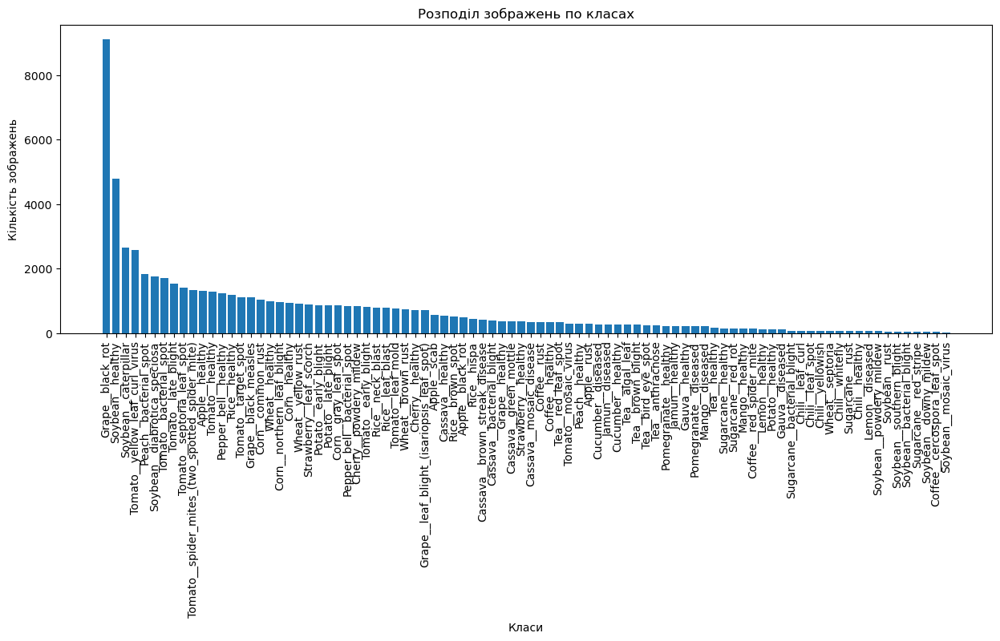

,Class,Count
29,Grape__black_rot,9110
56,Soybean__healthy,4797
53,Soybean__caterpillar,2647
83,Tomato__yellow_leaf_curl_virus,2570
38,Peach__bacterial_spot,1837
54,Soybean__diabrotica_speciosa,1764
74,Tomato__bacterial_spot,1708
77,Tomato__late_blight,1535
80,Tomato__septoria_leaf_spot,1424
81,Tomato__spider_mites_(two_spotted_spider_mite),1340


In [ ]:
pd.set_option('display.max_rows', None)

class_counts = {class_name: len(os.listdir(os.path.join("PlantDiseaseDatasetSplit2/train", class_name))) for class_name in class_names}

df_classes = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])
df_classes = df_classes.sort_values(by="Count", ascending=False)

pd.set_option('display.max_rows', None)


# Візуалізація
plt.figure(figsize=(15, 5))
plt.bar(df_classes["Class"], df_classes["Count"])
plt.xticks(rotation=90)
plt.xlabel("Класи")
plt.ylabel("Кількість зображень")
plt.title("Розподіл зображень по класах")
plt.show()

display(df_classes)


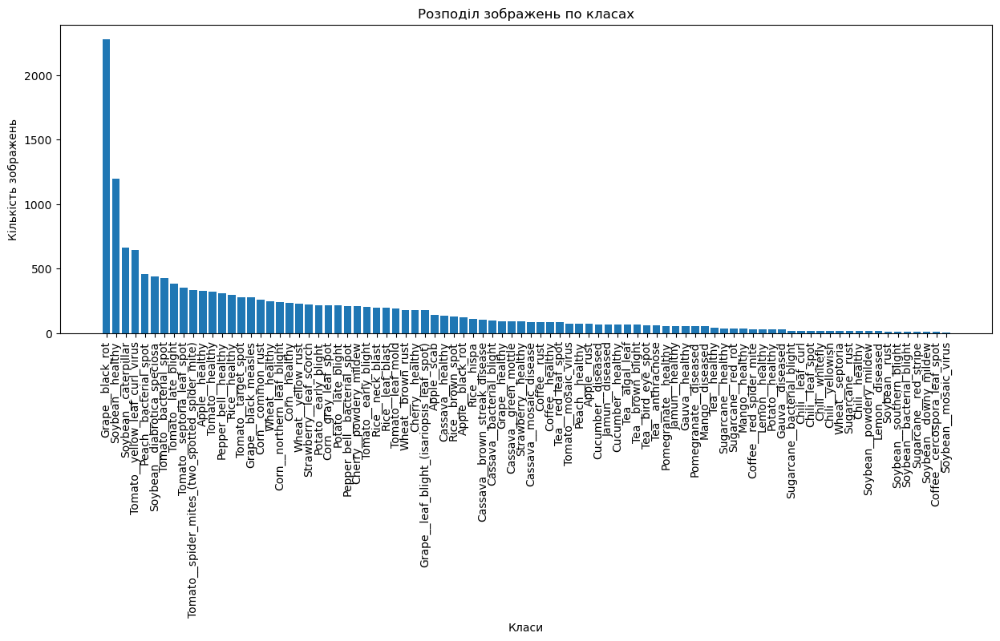

,Class,Count
29,Grape__black_rot,2277
56,Soybean__healthy,1199
53,Soybean__caterpillar,661
83,Tomato__yellow_leaf_curl_virus,642
38,Peach__bacterial_spot,459
54,Soybean__diabrotica_speciosa,441
74,Tomato__bacterial_spot,427
77,Tomato__late_blight,383
80,Tomato__septoria_leaf_spot,356
81,Tomato__spider_mites_(two_spotted_spider_mite),335


In [ ]:
pd.set_option('display.max_rows', None)

class_counts = {class_name: len(os.listdir(os.path.join("PlantDiseaseDatasetSplit2/valid", class_name))) for class_name in class_names}

df_classes = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])
df_classes = df_classes.sort_values(by="Count", ascending=False)

pd.set_option('display.max_rows', None)


# Візуалізація
plt.figure(figsize=(15, 5))
plt.bar(df_classes["Class"], df_classes["Count"])
plt.xticks(rotation=90)
plt.xlabel("Класи")
plt.ylabel("Кількість зображень")
plt.title("Розподіл зображень по класах")
plt.show()

display(df_classes)


In [ ]:
datagen = ImageDataGenerator(
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    brightness_range=[0.6, 1.2],
    vertical_flip=True,
    preprocessing_function=lambda x: x + np.random.normal(0, 0.05, x.shape),
    fill_mode='nearest'
)

source_dir = "PlantDiseaseDatasetSplit2/rr"
target_dir = "PlantDiseaseDatasetSplit2/train_aug_2000"

# Перебираємо класи в вихідній папці
for class_name in os.listdir(source_dir):
    class_path = os.path.join(source_dir, class_name)
    if not os.path.isdir(class_path):
        continue  # Пропускаємо не-папки

    # Генеруємо шлях для збереження
    save_path = os.path.join(target_dir, class_name)
    os.makedirs(save_path, exist_ok=True)

    aug_generator = datagen.flow_from_directory(
        directory=class_path,
        target_size=(256, 256),
        batch_size=1,
        classes=[''],
        shuffle=True,
        save_prefix='aug',
        class_mode=None,
        save_to_dir=save_path,  # Зберігати в ту ж підпапку
        save_format='jpg'
    )

    # Генеруємо зображення для цього класу
    num_augmented_images = 2000
    for i in range(num_augmented_images):
        next(aug_generator)


Found 49 images belonging to 1 classes.
Found 364 images belonging to 1 classes.
Found 887 images belonging to 1 classes.
Found 80 images belonging to 1 classes.
Found 143 images belonging to 1 classes.
Found 139 images belonging to 1 classes.
Found 42 images belonging to 1 classes.
Found 74 images belonging to 1 classes.
Found 271 images belonging to 1 classes.
Found 240 images belonging to 1 classes.
Found 240 images belonging to 1 classes.
Found 268 images belonging to 1 classes.
Found 177 images belonging to 1 classes.
Found 343 images belonging to 1 classes.
Found 1708 images belonging to 1 classes.
Found 806 images belonging to 1 classes.
Found 1277 images belonging to 1 classes.
Found 1535 images belonging to 1 classes.
Found 765 images belonging to 1 classes.
Found 304 images belonging to 1 classes.
Found 1424 images belonging to 1 classes.
Found 1340 images belonging to 1 classes.
Found 1123 images belonging to 1 classes.
Found 2570 images belonging to 1 classes.
Found 730 ima

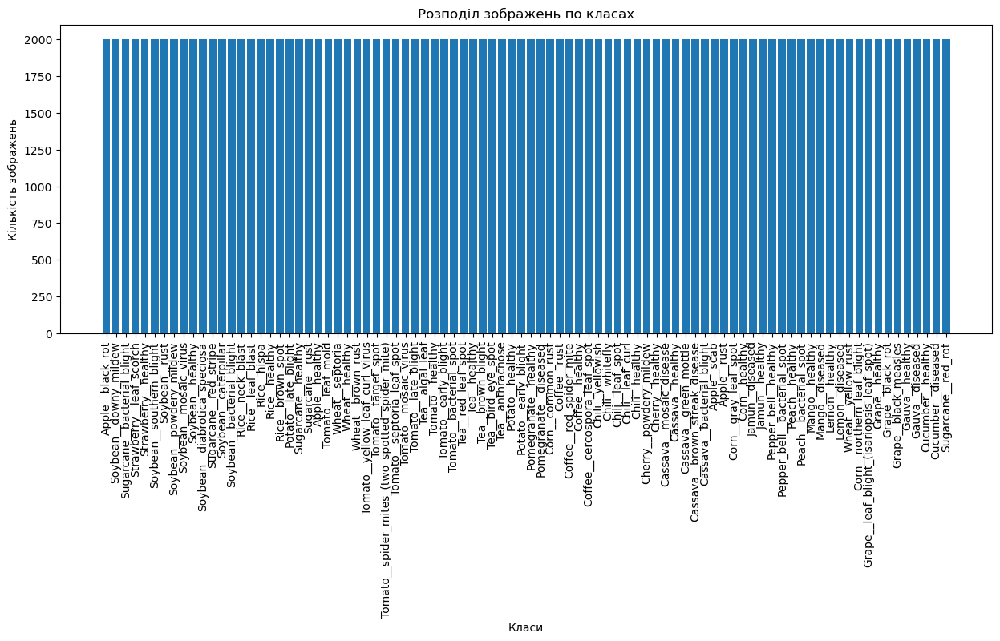

,Class,Count
0,Apple__black_rot,2000
55,Soybean__downy_mildew,2000
63,Sugarcane__bacterial_blight,2000
62,Strawberry__leaf_scorch,2000
61,Strawberry__healthy,2000
60,Soybean__southern_blight,2000
59,Soybean__rust,2000
58,Soybean__powdery_mildew,2000
57,Soybean__mosaic_virus,2000
56,Soybean__healthy,2000


In [ ]:
pd.set_option('display.max_rows', None)

class_counts = {class_name: len(os.listdir(os.path.join("PlantDiseaseDatasetSplit2/train_aug", class_name))) for class_name in class_names}

df_classes = pd.DataFrame(list(class_counts.items()), columns=["Class", "Count"])
df_classes = df_classes.sort_values(by="Count", ascending=False)

pd.set_option('display.max_rows', None)


# Візуалізація
plt.figure(figsize=(15, 5))
plt.bar(df_classes["Class"], df_classes["Count"])
plt.xticks(rotation=90)
plt.xlabel("Класи")
plt.ylabel("Кількість зображень")
plt.title("Розподіл зображень по класах")
plt.show()

display(df_classes)


In [ ]:
classes = os.listdir("PlantDiseaseDatasetSplit2/train_aug")

plt.figure(figsize=(16, 88))

for i, class_name in enumerate(classes[:88]): 
    class_path = os.path.join("PlantDiseaseDatasetSplit2/train_aug", class_name)
    images = os.listdir(class_path)
    img_path = os.path.join(class_path, random.choice(images))
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(22, 4, i + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.show()

In [ ]:
classes = os.listdir("PlantDiseaseDatasetSplit2/train_aug_3000")

plt.figure(figsize=(32, 44))

for i, class_name in enumerate(classes[:88]): 
    class_path = os.path.join("PlantDiseaseDatasetSplit2/train_aug_3000", class_name)
    images = os.listdir(class_path)
    img_path = os.path.join(class_path, images[0])
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(11, 8, i + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.show()

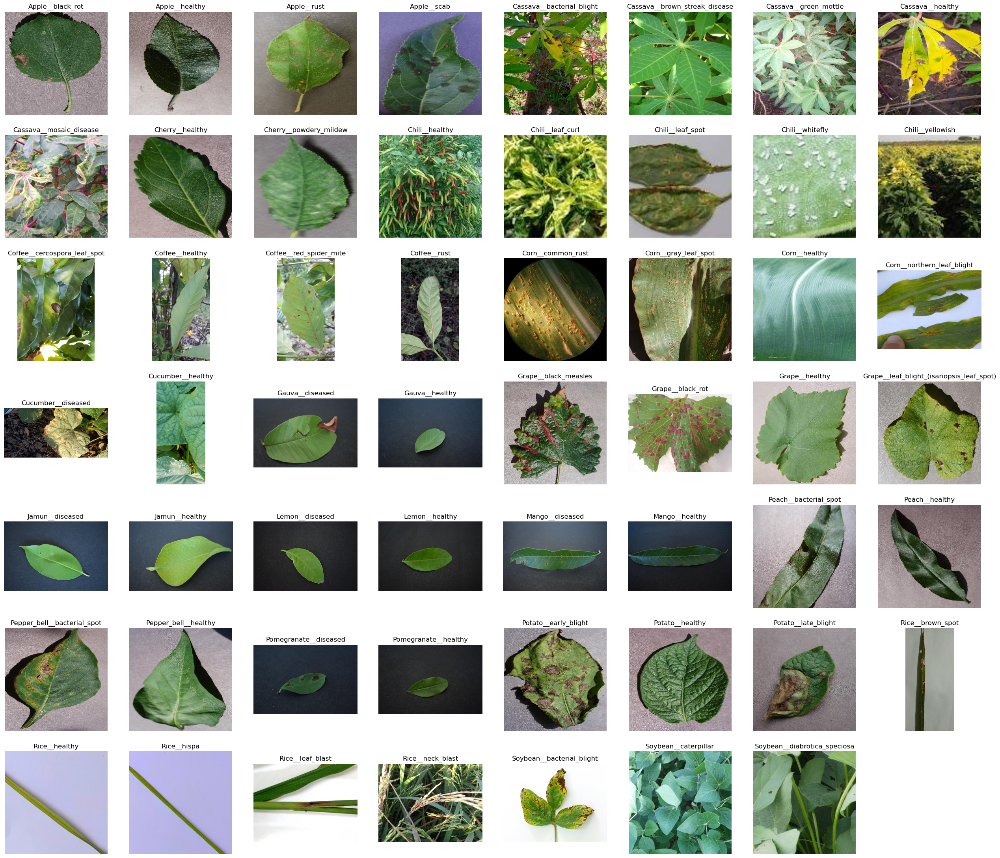

In [ ]:
classes = os.listdir("PlantDiseaseDatasetSplit2/train")

plt.figure(figsize=(32, 44))

for i, class_name in enumerate(classes[:88]): 
    class_path = os.path.join("PlantDiseaseDatasetSplit2/train", class_name)
    images = os.listdir(class_path)
    img_path = os.path.join(class_path, images[0])
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(11, 8, i + 1)
    plt.imshow(img)
    plt.title(class_name)
    plt.axis("off")

plt.show()

# Creating Planty-Net model (final)

In [ ]:
def load_dataset(directory, batch_size=8):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        batch_size=batch_size,
        shuffle=True,
        image_size=(256, 256),
        label_mode='categorical'
    )
    # Нормалізація
    normalization_layer = tf.keras.layers.Rescaling(1./255)
    dataset = dataset.map(lambda x, y: (normalization_layer(x), y))
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

train_gen4 = load_dataset('PlantDiseaseDatasetSplit2/train_aug_3000', batch_size=16)
valid_gen4 = load_dataset('PlantDiseaseDatasetSplit2/valid', batch_size=32)

Found 264000 files belonging to 88 classes.
Found 15763 files belonging to 88 classes.


In [ ]:
import tensorflow as tf

class WarmUp(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, initial_lr, decay_schedule_fn, warmup_steps, warmup_lr=0.0):
        super(WarmUp, self).__init__()
        self.initial_lr = initial_lr
        self.decay_schedule_fn = decay_schedule_fn
        self.warmup_steps = warmup_steps
        self.warmup_lr = warmup_lr

    def __call__(self, step):
        warmup_lr = self.warmup_lr + (self.initial_lr - self.warmup_lr) * tf.cast(step, tf.float32) / tf.cast(self.warmup_steps, tf.float32)
        return tf.cond(
            step < self.warmup_steps,
            lambda: warmup_lr,
            lambda: self.decay_schedule_fn(step)
        )

    def get_config(self):
        return {
            "initial_lr": self.initial_lr,
            "warmup_lr": self.warmup_lr,
            "warmup_steps": self.warmup_steps,
            "decay_schedule_fn": self.decay_schedule_fn
        }


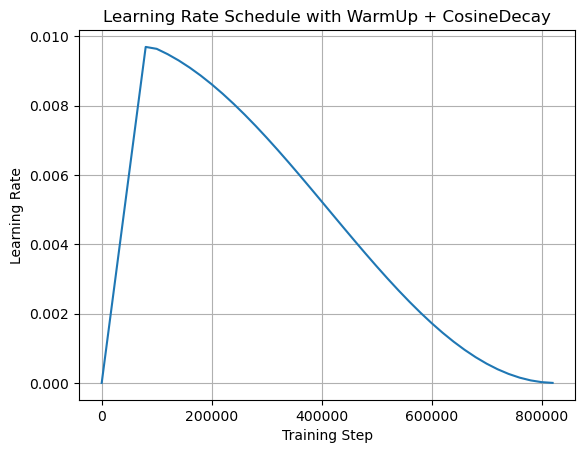

In [ ]:
import matplotlib.pyplot as plt

steps = tf.range(0, decay_steps, 20000)
lrs = [lr_schedule(step).numpy() for step in steps]

plt.plot(steps, lrs)
plt.title("Learning Rate Schedule with WarmUp + CosineDecay")
plt.xlabel("Training Step")
plt.ylabel("Learning Rate")
plt.grid(True)
plt.show()


In [ ]:
initial_lr = 0.01
decay_steps = len(train_gen4) * 50
warmup_steps = 5 * len(train_gen4)

cosine_decay = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=initial_lr,
    decay_steps=decay_steps,
    alpha=1e-6
)

lr_schedule = WarmUp(
    initial_lr=initial_lr,
    decay_schedule_fn=cosine_decay,
    warmup_steps=warmup_steps,
    warmup_lr=0.0
)


In [ ]:
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, GlobalMaxPooling2D,
                                     Reshape, Permute, multiply, Add, Activation,
                                     Conv2D, Concatenate, Lambda)

def se_block(input_tensor, ratio=8):
    channel_axis = -1
    filters = input_tensor.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(input_tensor)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
    x = multiply([input_tensor, se])
    return x

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, SpatialDropout2D, GlobalAveragePooling2D, Dense, Dropout, Concatenate, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

input_layer = Input(shape=(256, 256, 3))

# --- Block 1 ---
x = Conv2D(16, (3, 3), activation='relu')(input_layer)
x = BatchNormalization()(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = BatchNormalization()(x)
x = se_block(x)
x = MaxPooling2D((2, 2))(x)
x = SpatialDropout2D(0.05)(x)

# --- Block 2 ---
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = se_block(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
x = SpatialDropout2D(0.1)(x)

# --- Block 3 (64 filters) ---
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = se_block(x)
# Зберігаємо ознаки після 64 фільтрів
x_64 = GlobalAveragePooling2D()(x)

x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
x = SpatialDropout2D(0.15)(x)

# --- Block 4 ---
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = se_block(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)
x = SpatialDropout2D(0.2)(x)

# --- Block 5 (256 filters) ---
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = se_block(x)

# Зберігаємо ознаки після 256 фільтрів
x_256 = GlobalAveragePooling2D()(x)

# --- Об'єднуємо ознаки ---
x = Concatenate()([x_64, x_256])
x = BatchNormalization()(x)

# --- Класифікатор ---
x = Dropout(0.2)(x)
x = Dense(2048, activation='relu', kernel_regularizer=l2(0.0005))(x)
x = Dropout(0.5)(x)
output = Dense(88, activation='softmax')(x)

# --- Створення моделі ---
model_raz2_se = Model(inputs=input_layer, outputs=output)

# --- Компіляція ---
lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=0.01,
    decay_steps=16500 * 70,
    alpha=1e-10
)
model_raz2_se.compile(optimizer=keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.9),
              loss='categorical_crossentropy', metrics=['accuracy'])

model_raz2_se.summary()

# --- Колбеки ---
checkpoint_callback = ModelCheckpoint(
    filepath='best_model_rgb8_3__raz2_se.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, min_delta=0.01)

# --- Тренування ---
history_raz2_se = model_raz2_se.fit(train_gen4, epochs=70, validation_data=valid_gen4,
                    callbacks=[early_stopping, checkpoint_callback])

# --- Графік ---
plot_training_history(history_raz2_se)


Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_28 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_162 (Conv2D)            (None, 254, 254, 16  448         ['input_28[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_131 (Batch  (None, 254, 254, 16  64         ['conv2d_162[0][0]']             
 Normalization)                 )                                                          

In [ ]:
history_raz2_se_2 = model_raz2_se.fit(train_gen4, epochs=34, validation_data=valid_gen4,
                    callbacks=[early_stopping, checkpoint_callback])


Epoch 1/34
16500/16500 [==============================] - ETA: 0s - loss: 0.3239 - accuracy: 0.9308
Epoch 1: val_accuracy did not improve from 0.94170
16500/16500 [==============================] - 1535s 93ms/step - loss: 0.3239 - accuracy: 0.9308 - val_loss: 0.3533 - val_accuracy: 0.9380
Epoch 2/34
16500/16500 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.9326
Epoch 2: val_accuracy did not improve from 0.94170
16500/16500 [==============================] - 1527s 93ms/step - loss: 0.3132 - accuracy: 0.9326 - val_loss: 0.3520 - val_accuracy: 0.9385
Epoch 3/34
16500/16500 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.9329
Epoch 3: val_accuracy did not improve from 0.94170
16500/16500 [==============================] - 1471s 89ms/step - loss: 0.3076 - accuracy: 0.9329 - val_loss: 0.3386 - val_accuracy: 0.9396
Epoch 4/34
16500/16500 [==============================] - ETA: 0s - loss: 0.2953 - accuracy: 0.9356
Epoch 4: val_accuracy did not 

In [ ]:
model_raz2_se.save('model_raz2_se.keras')

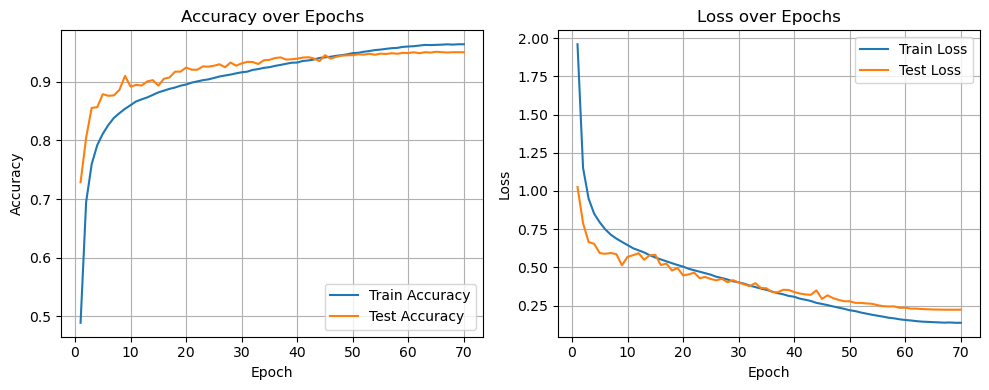

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, label='Train Accuracy')
plt.plot(epochs, val_acc, label='Test Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Test Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Завантаження моделі
model = model_raz2_se

# Примусове приведення виходу до float32
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Lambda

# Обгортка виходу
output = model.output
if output.dtype != tf.float32:
    output = Lambda(lambda x: tf.cast(x, tf.float32))(output)
    model = Model(inputs=model.input, outputs=output)

# Перевірка dtype перед збереженням
print("Output dtype:", model.output.dtype)  # Має бути float32

# Конвертація
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,  # Стандартні TFLite-операції
    tf.lite.OpsSet.SELECT_TF_OPS     # Додаткові (Flex) TensorFlow-операції
]
tflite_model = converter.convert()

with open('model3.tflite', 'wb') as f:
    f.write(tflite_model)

Output dtype: <dtype: 'float32'>


INFO:tensorflow:Assets written to: C:\Users\Dmitr\AppData\Local\Temp\tmpdgsz1mgh\assets


INFO:tensorflow:Assets written to: C:\Users\Dmitr\AppData\Local\Temp\tmpdgsz1mgh\assets


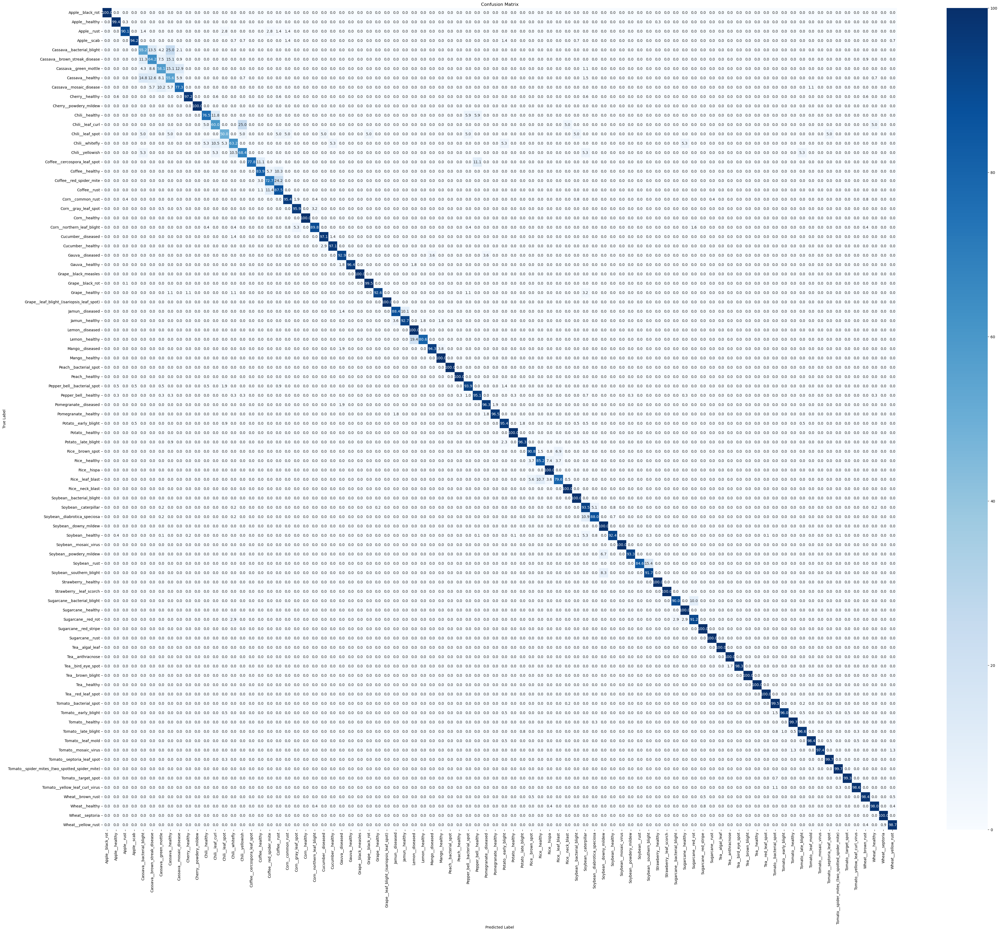


Classification Report:
                                                precision    recall  f1-score   support

                              Apple__black_rot       1.00      1.00      1.00       124
                                Apple__healthy       0.98      0.99      0.98       329
                                   Apple__rust       0.94      0.90      0.92        71
                                   Apple__scab       0.98      0.94      0.96       139
                     Cassava__bacterial_blight       0.58      0.55      0.56        96
                 Cassava__brown_streak_disease       0.61      0.64      0.63       106
                         Cassava__green_mottle       0.59      0.58      0.58        93
                              Cassava__healthy       0.54      0.56      0.55       135
                       Cassava__mosaic_disease       0.74      0.77      0.76        88
                               Cherry__healthy       0.98      0.97      0.97       178
       

In [ ]:
import tensorflow as tf
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Функция для построения confusion matrix
def plot_confusion_matrix(model, test_data, class_names):
    # Получаем истинные метки и предсказания
    y_true = []
    y_pred = []

    for images, labels in test_data:
        preds = model.predict(images, verbose='0')  # Предсказания модели
        y_true.extend(np.argmax(labels.numpy(), axis=1))  # Истинные метки
        y_pred.extend(np.argmax(preds, axis=1))  # Предсказанные метки

    # Создаём confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_percent = cm.astype('float') / cm.sum(axis=1, keepdims=True) * 100

    # Визуализация
    plt.figure(figsize=(48, 40))
    sns.heatmap(cm_percent, annot=True, fmt=".1f", cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

    # Выводим отчёт о классификации
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names))

# Вызываем функцию для вывода confusion matrix
plot_confusion_matrix(model_raz2_se, valid_gen4, class_names)


Conv2D шари: ['conv2d_172', 'conv2d_173', 'conv2d_174', 'conv2d_175', 'conv2d_176', 'conv2d_177', 'conv2d_178', 'conv2d_179']
SE (multiply) шари: ['multiply_94', 'multiply_95', 'multiply_96', 'multiply_97']
Генеруємо CAM для шару: conv2d_172
1/1 [==============================] - 1s 597ms/step


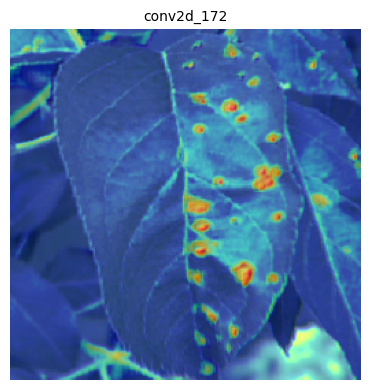

Генеруємо CAM для шару: conv2d_173
1/1 [==============================] - 0s 51ms/step


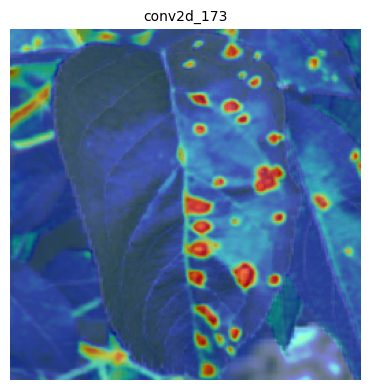

Генеруємо CAM для шару: conv2d_174
1/1 [==============================] - 0s 75ms/step


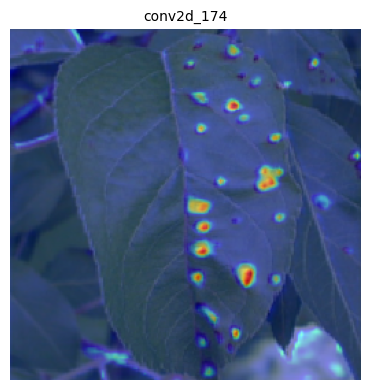

Генеруємо CAM для шару: conv2d_175
1/1 [==============================] - 0s 64ms/step


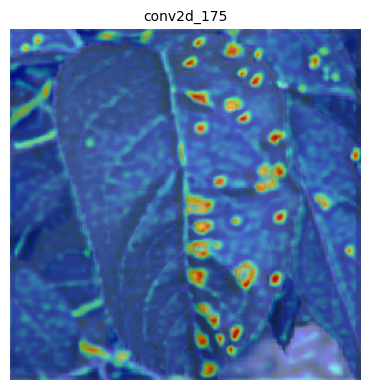

Генеруємо CAM для шару: conv2d_176
2/2 [==============================] - 0s 84ms/step


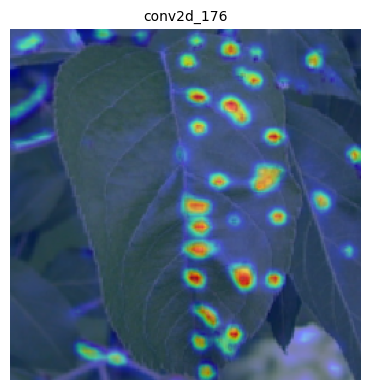

Генеруємо CAM для шару: conv2d_177
2/2 [==============================] - 0s 58ms/step


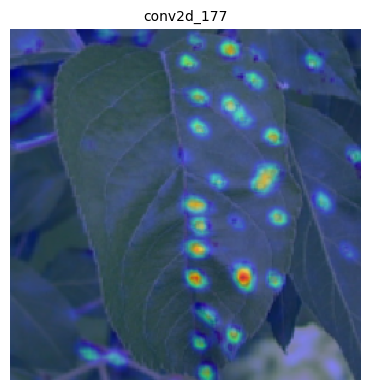

Генеруємо CAM для шару: conv2d_178
4/4 [==============================] - 0s 55ms/step


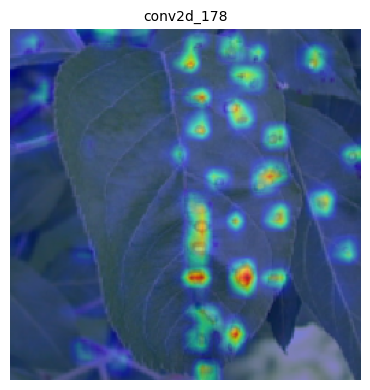

Генеруємо CAM для шару: conv2d_179
4/4 [==============================] - 0s 42ms/step


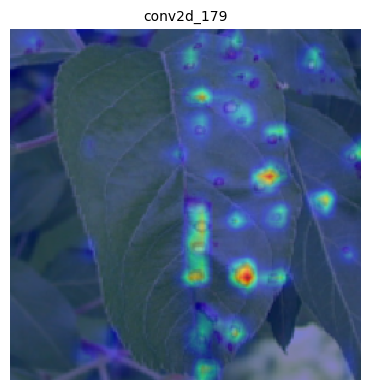

Генеруємо CAM для шару: multiply_94
1/1 [==============================] - 0s 56ms/step


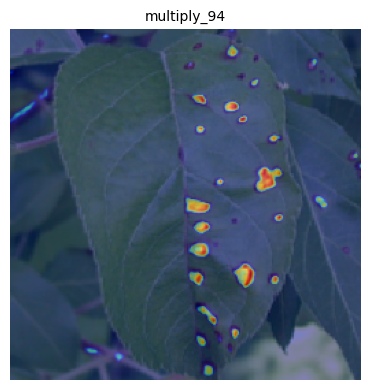

Генеруємо CAM для шару: multiply_95
1/1 [==============================] - 0s 53ms/step


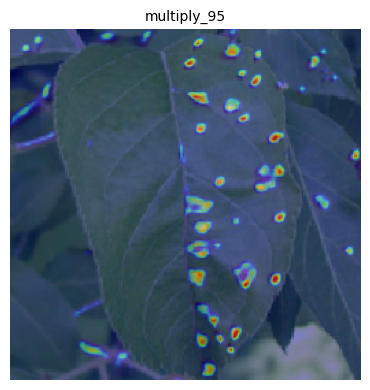

Генеруємо CAM для шару: multiply_96
2/2 [==============================] - 0s 80ms/step


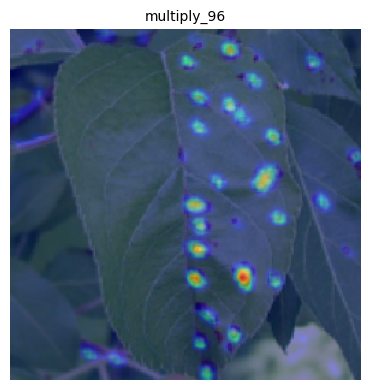

Генеруємо CAM для шару: multiply_97
4/4 [==============================] - 0s 73ms/step


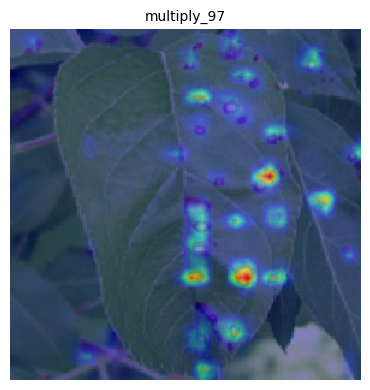

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tf_keras_vis.scorecam import Scorecam
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

# Завантаження зображення та перетворення у формат, придатний для моделі
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Додаємо вимір batch
    img_array = img_array / 255.0  # Нормалізація
    return img_array

# Об'єднана функція для візуалізації зображень та теплових карт
def plot_images(images=None, maps=None, titles=None):
    num_images = 0
    if images is not None:
        num_images = len(images)
    elif maps is not None:
        num_images = len(maps)
    else:
        return

    _, ax = plt.subplots(1, num_images, figsize=(5 * num_images, 4))
    if num_images == 1:
        ax = [ax]

    for i in range(num_images):
        alpha = 1
        if images is not None:
            alpha = 0.5
            image = images[i]
            ax[i].imshow(image)
        if maps is not None:
            mp = maps[i]
            heatmap = np.uint8(cm.jet(mp)[..., :3] * 255)
            ax[i].imshow(heatmap, cmap='jet', alpha=alpha)
        if titles:
            ax[i].set_title(titles[i], fontsize=10)
        ax[i].axis('off')
    plt.tight_layout()
    plt.show()

# Ініціалізація Score-CAM
scorecam = Scorecam(model_raz2_se, model_modifier=ReplaceToLinear())

# Завантаження зображення
image_path = "./PlantDiseaseDatasetSplit2/test/Apple__black_rot/Black_rot_(frog_eye_leaf_spot)-WWT-C.png"
image = load_and_preprocess_image(image_path)

# Визначення функції оцінки (наприклад, клас 0)
labels = np.array([0])  # Заміни на потрібний клас
score_function = CategoricalScore(labels.astype('int8').tolist())

# Збір назв шарів Conv2D та multiply (SE-блоки)
conv2d_layers = [layer.name for layer in model_raz2_se.layers if isinstance(layer, tf.keras.layers.Conv2D)]
se_layers = [layer.name for layer in model_raz2_se.layers if layer.name.startswith('multiply')]

print("Conv2D шари:", conv2d_layers)
print("SE (multiply) шари:", se_layers)

# Для кожного Conv2D шару
for layer_name in conv2d_layers + se_layers:
    print(f"Генеруємо CAM для шару: {layer_name}")
    cam = scorecam(score_function, image, layer_name, seek_penultimate_conv_layer=False)

    # Візуалізація
    plot_images(images=[image[0]], maps=[cam[0]], titles=[layer_name])
